In [1]:
%pip install -q celluloid

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera
from IPython.display import HTML

import subprocess
import sys
import os


In [3]:
# Poner la ruta donde esté el directorio "Parcial2"

os.chdir("/home/santiago/santiago_FCII_20251/Parcial2")

## 1. Solución del problema con condiciones periódicas

$\beta=0.01$

In [4]:
beta = 0.01
zmax = 200
tmax = 100
periodic = 1
name = "final_sol_1.txt"

In [5]:
subprocess.getoutput(f"make clean && make && ./obj/main.out {beta} {zmax} {tmax} {periodic} " + name + " > output.dat")
nt=subprocess.getoutput("grep 'nt' output.dat | awk -F'=' '{print $2}'")

nt = float(nt)

In [6]:
# Poner la ruta donde esté el archivo "inital_conds.txt"

init = np.loadtxt("/home/santiago/santiago_FCII_20251/Parcial2/initial_conds.txt")

zE0 = init[:,0]
E0 = init[:,1]
zH0 = init[:,2]
H0 = init[:,3]

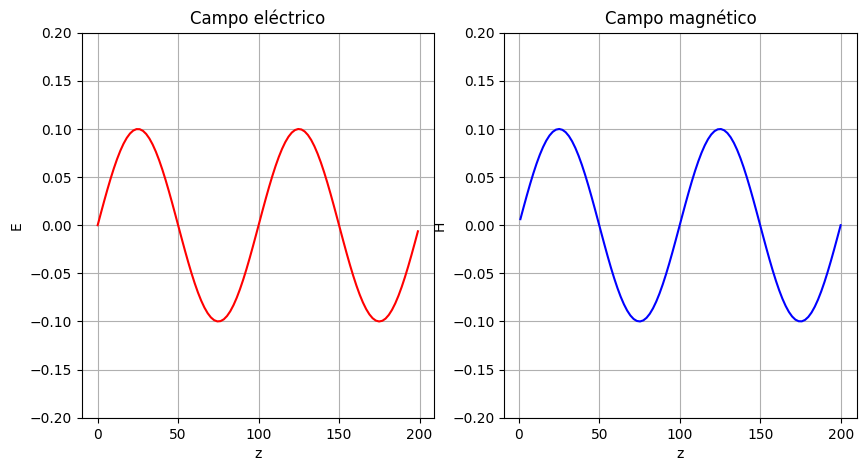

In [7]:
fig,ax = plt.subplots(1,2,figsize=(10,5))

ax[0].plot(zE0,E0,'r')
ax[1].plot(zH0,H0,'b')

ax[0].set(title='Campo eléctrico',
           xlabel='z',
           ylabel='E',ylim=(-0.2,0.2))
ax[1].set(title='Campo magnético',
           xlabel='z',
           ylabel='H',ylim=(-0.2,0.2))

ax[0].grid()
ax[1].grid()

plt.savefig('initial_conds.png')
plt.show()

In [8]:
# Poner la ruta donde esté el archivo [name]

fulldata = np.loadtxt("/home/santiago/santiago_FCII_20251/Parcial2/"+name,comments="#")

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

In [9]:
if nt > 100:
    step = np.log10(nt)
    step = int(10**(step-2.25))
else:
    step = 1

print(f'\n step = {step} \n')

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

fig,ax = plt.subplots(1,2,figsize=(12,5))
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax[0].plot(zE[i],E[i],'r')
    ax[1].plot(zH[i],H[i],'b')
    cam.snap()

ax[0].set(title='Campo eléctrico',
           xlabel='z',
           ylabel='E',ylim=(-0.2,0.2))
ax[1].set(title='Campo magnético',
           xlabel='z',
           ylabel='H',ylim=(-0.2,0.2))
ax[0].grid()
ax[1].grid()
plt.close()

anim = cam.animate(interval = 40)
anim.save('anim1.gif')
HTML(anim.to_html5_video())


 step = 55 



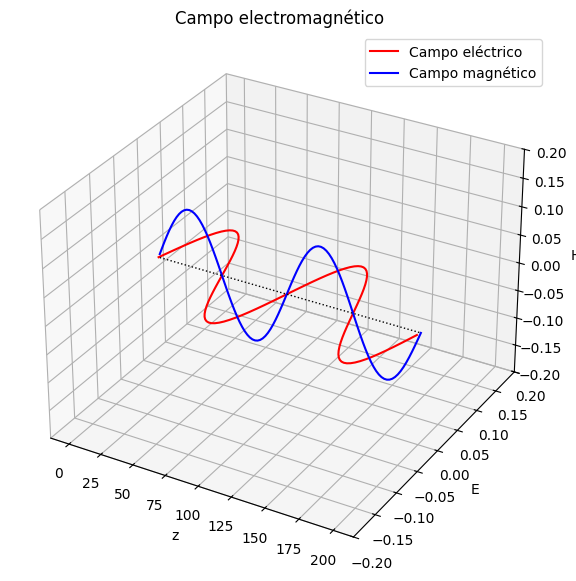

In [10]:
ax = plt.figure(figsize=(7,7)).add_subplot(projection='3d')

ax.plot(zE0,E0,np.zeros_like(E0),'r',label='Campo eléctrico')
ax.plot(zH0,np.zeros_like(H0),H0,'b',label='Campo magnético')
ax.plot(zH0,np.zeros_like(H0),np.zeros_like(H0),'k:',lw=1)

ax.set(title='Campo electromagnético',
           xlabel='z',
           ylabel='E',
           zlabel='H',ylim=(-0.2,0.2),zlim=(-0.2,0.2))

ax.legend()

plt.savefig('initial_conds3d.png')
plt.show()

In [11]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(projection='3d')
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax.plot(zE[i],E[i],np.zeros_like(E0),'r')
    ax.plot(zH[i],np.zeros_like(E0),H[i],'b')
    ax.plot(zH0,np.zeros_like(H0),np.zeros_like(H0),'k:',lw=1)
    cam.snap()

ax.set(title='Campo electromagnético',
           xlabel='z',
           ylabel='E',
           zlabel='H',ylim=(-0.2,0.2),zlim=(-0.2,0.2))

plt.close()

anim = cam.animate(interval = 40)
anim.save('anim1_3d.gif')
HTML(anim.to_html5_video())

## 2. Solución del problema con condiciones de Dirichlet

$\beta=0.01$

In [12]:
beta = 0.01
zmax = 200
tmax = 100
periodic = 0
name = "final_sol_2.txt"

In [13]:
subprocess.getoutput(f"make clean && make && ./obj/main.out {beta} {zmax} {tmax} {periodic} " + name + " > output.dat")
nt=subprocess.getoutput("grep 'nt' output.dat | awk -F'=' '{print $2}'")

nt = float(nt)

In [14]:
# Poner la ruta donde esté el archivo [name]

fulldata = np.loadtxt("/home/santiago/santiago_FCII_20251/Parcial2/"+name,comments="#")

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

In [15]:
if nt > 100:
    step = np.log10(nt)
    step = int(10**(step-2.25))
else:
    step = 1

print(f'\n step = {step} \n')

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

fig,ax = plt.subplots(1,2,figsize=(12,5))
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax[0].plot(zE[i],E[i],'r')
    ax[1].plot(zH[i],H[i],'b')
    cam.snap()

ax[0].set(title='Campo eléctrico',
           xlabel='z',
           ylabel='E',ylim=(-0.2,0.2))
ax[1].set(title='Campo magnético',
           xlabel='z',
           ylabel='H',ylim=(-0.2,0.2))
ax[0].grid()
ax[1].grid()
plt.close()

anim = cam.animate(interval = 40)
anim.save('anim2.gif')
HTML(anim.to_html5_video())


 step = 55 



In [16]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(projection='3d')
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax.plot(zE[i],E[i],np.zeros_like(E0),'r')
    ax.plot(zH[i],np.zeros_like(E0),H[i],'b')
    ax.plot(zH0,np.zeros_like(H0),np.zeros_like(H0),'k:',lw=1)
    cam.snap()

ax.set(title='Campo electromagnético',
           xlabel='z',
           ylabel='E',
           zlabel='H',ylim=(-0.2,0.2),zlim=(-0.2,0.2))

plt.close()

anim = cam.animate(interval = 40)
anim.save('anim2_3d.gif')
HTML(anim.to_html5_video())

Cuando la onda llega a la pared, interfiere consigo misma, produciendo los pulsos, cuya envolvente es característica de una onda estacionaria, a diferencia del caso anterior, en el cual la onda continúa su propagación libremente.

## 3. Condición de Courant

$\beta=0.2$

In [17]:
beta = 0.2
zmax = 200
tmax = 100
periodic = 0
name = "final_sol_3.txt"

In [18]:
subprocess.getoutput(f"make clean && make && ./obj/main.out {beta} {zmax} {tmax} {periodic} " + name + " > output.dat")
nt=subprocess.getoutput("grep 'nt' output.dat | awk -F'=' '{print $2}'")

nt = float(nt)

In [19]:
# Poner la ruta donde esté el archivo [name]

fulldata = np.loadtxt("/home/santiago/santiago_FCII_20251/Parcial2/"+name,comments="#")

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

In [20]:
if nt > 100:
    step = np.log10(nt)
    step = int(10**(step-2.25))
else:
    step = 1

print(f'\n step = {step} \n')

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

fig,ax = plt.subplots(1,2,figsize=(12,5))
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax[0].plot(zE[i],E[i],'r')
    ax[1].plot(zH[i],H[i],'b')
    cam.snap()

ax[0].set(title='Campo eléctrico',
           xlabel='z',
           ylabel='E',ylim=(-0.2,0.2))
ax[1].set(title='Campo magnético',
           xlabel='z',
           ylabel='H',ylim=(-0.2,0.2))
ax[0].grid()
ax[1].grid()
plt.close()

anim = cam.animate(interval = 40)
anim.save('anim3.gif')
HTML(anim.to_html5_video())


 step = 2 



In [21]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(projection='3d')
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax.plot(zE[i],E[i],np.zeros_like(E0),'r')
    ax.plot(zH[i],np.zeros_like(E0),H[i],'b')
    ax.plot(zH0,np.zeros_like(H0),np.zeros_like(H0),'k:',lw=1)
    cam.snap()

ax.set(title='Campo electromagnético',
           xlabel='z',
           ylabel='E',
           zlabel='H',ylim=(-0.2,0.2),zlim=(-0.2,0.2))

plt.close()

anim = cam.animate(interval = 40)
anim.save('anim3_3d.gif')
HTML(anim.to_html5_video())

$\beta=0.1$

In [22]:
beta = 0.1
zmax = 200
tmax = 100
periodic = 0
name = "final_sol_4.txt"

In [23]:
subprocess.getoutput(f"make clean && make && ./obj/main.out {beta} {zmax} {tmax} {periodic} " + name + " > output.dat")
nt=subprocess.getoutput("grep 'nt' output.dat | awk -F'=' '{print $2}'")

nt = float(nt)

In [24]:
# Poner la ruta donde esté el archivo [name]

fulldata = np.loadtxt("/home/santiago/santiago_FCII_20251/Parcial2/"+name,comments="#")

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

In [25]:
if nt > 100:
    step = np.log10(nt)
    step = int(10**(step-2.25))
else:
    step = 1

print(f'\n step = {step} \n')

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

fig,ax = plt.subplots(1,2,figsize=(12,5))
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax[0].plot(zE[i],E[i],'r')
    ax[1].plot(zH[i],H[i],'b')
    cam.snap()

ax[0].set(title='Campo eléctrico',
           xlabel='z',
           ylabel='E',ylim=(-0.2,0.2))
ax[1].set(title='Campo magnético',
           xlabel='z',
           ylabel='H',ylim=(-0.2,0.2))
ax[0].grid()
ax[1].grid()
plt.close()

anim = cam.animate(interval = 40)
anim.save('anim4.gif')
HTML(anim.to_html5_video())


 step = 5 



In [26]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(projection='3d')
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax.plot(zE[i],E[i],np.zeros_like(E0),'r')
    ax.plot(zH[i],np.zeros_like(E0),H[i],'b')
    ax.plot(zH0,np.zeros_like(H0),np.zeros_like(H0),'k:',lw=1)
    cam.snap()

ax.set(title='Campo electromagnético',
           xlabel='z',
           ylabel='E',
           zlabel='H',ylim=(-0.2,0.2),zlim=(-0.2,0.2))

plt.close()

anim = cam.animate(interval = 40)
anim.save('anim4_3d.gif')
HTML(anim.to_html5_video())

$\beta=0.05$

In [27]:
beta = 0.05
zmax = 200
tmax = 100
periodic = 0
name = "final_sol_5.txt"

In [28]:
subprocess.getoutput(f"make clean && make && ./obj/main.out {beta} {zmax} {tmax} {periodic} " + name + " > output.dat")
nt=subprocess.getoutput("grep 'nt' output.dat | awk -F'=' '{print $2}'")

nt = float(nt)

In [29]:
# Poner la ruta donde esté el archivo [name]

fulldata = np.loadtxt("/home/santiago/santiago_FCII_20251/Parcial2/"+name,comments="#")

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

In [30]:
if nt > 100:
    step = np.log10(nt)
    step = int(10**(step-2.25))
else:
    step = 1

print(f'\n step = {step} \n')

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

fig,ax = plt.subplots(1,2,figsize=(12,5))
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax[0].plot(zE[i],E[i],'r')
    ax[1].plot(zH[i],H[i],'b')
    cam.snap()

ax[0].set(title='Campo eléctrico',
           xlabel='z',
           ylabel='E',ylim=(-0.2,0.2))
ax[1].set(title='Campo magnético',
           xlabel='z',
           ylabel='H',ylim=(-0.2,0.2))
ax[0].grid()
ax[1].grid()
plt.close()

anim = cam.animate(interval = 40)
anim.save('anim5.gif')
HTML(anim.to_html5_video())


 step = 11 



In [31]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(projection='3d')
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax.plot(zE[i],E[i],np.zeros_like(E0),'r')
    ax.plot(zH[i],np.zeros_like(E0),H[i],'b')
    ax.plot(zH0,np.zeros_like(H0),np.zeros_like(H0),'k:',lw=1)
    cam.snap()

ax.set(title='Campo electromagnético',
           xlabel='z',
           ylabel='E',
           zlabel='H',ylim=(-0.2,0.2),zlim=(-0.2,0.2))

plt.close()

anim = cam.animate(interval = 40)
anim.save('anim5_3d.gif')
HTML(anim.to_html5_video())

$\beta=0.001$

In [32]:
beta = 0.001
zmax = 200
tmax = 100
periodic = 0
name = "final_sol_6.txt"

In [33]:
subprocess.getoutput(f"make clean && make && ./obj/main.out {beta} {zmax} {tmax} {periodic} " + name + " > output.dat")
nt=subprocess.getoutput("grep 'nt' output.dat | awk -F'=' '{print $2}'")

nt = float(nt)

In [34]:
# Poner la ruta donde esté el archivo [name]

fulldata = np.loadtxt("/home/santiago/santiago_FCII_20251/Parcial2/"+name,comments="#")

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

In [35]:
if nt > 100:
    step = np.log10(nt)
    step = int(10**(step-2.25))
else:
    step = 1

print(f'\n step = {step} \n')

zE = fulldata[:,0]
E = fulldata[:,1]
zH = fulldata[:,2]
H = fulldata[:,3]

zE = zE.reshape((int(nt/2),100))
E = E.reshape((int(nt/2),100))
zH = zH.reshape((int(nt/2),100))
H = H.reshape((int(nt/2),100))

fig,ax = plt.subplots(1,2,figsize=(12,5))
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax[0].plot(zE[i],E[i],'r')
    ax[1].plot(zH[i],H[i],'b')
    cam.snap()

ax[0].set(title='Campo eléctrico',
           xlabel='z',
           ylabel='E',ylim=(-0.2,0.2))
ax[1].set(title='Campo magnético',
           xlabel='z',
           ylabel='H',ylim=(-0.2,0.2))
ax[0].grid()
ax[1].grid()
plt.close()

anim = cam.animate(interval = 40)
anim.save('anim6.gif')
HTML(anim.to_html5_video())


 step = 559 



In [36]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(projection='3d')
cam = Camera(fig)
for i in range(0,len(zE),step):
    ax.plot(zE[i],E[i],np.zeros_like(E0),'r')
    ax.plot(zH[i],np.zeros_like(E0),H[i],'b')
    ax.plot(zH0,np.zeros_like(H0),np.zeros_like(H0),'k:',lw=1)
    cam.snap()

ax.set(title='Campo electromagnético',
           xlabel='z',
           ylabel='E',
           zlabel='H',ylim=(-0.2,0.2),zlim=(-0.2,0.2))

plt.close()

anim = cam.animate(interval = 40)
anim.save('anim6_3d.gif')
HTML(anim.to_html5_video())

Nótese que hasta $\beta=0.1$ la solución al sistema es inestable, por lo que el criterio de Courant no se cumple para $\beta\leq0.5$ sino al menos para $\beta<0.1$. Se observa que para $\beta=0.05,0.01,0.001$ la envolvente de las ondas estacionarias está bien definida.